In [6]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, random_split, ConcatDataset
import tifffile as tiff
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from PIL import Image
from tqdm import tqdm
from torchvision import transforms

from skimage import io
import sys
# from umap import UMAP
import joblib
from datetime import datetime

# Load Data
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [7]:
# Get the directory of the script
script_dir = os.getcwd()

# Get the parent directory of the script
parent_dir = os.path.dirname(script_dir)

# Add the parent directory to sys.path
sys.path.append(parent_dir)

from core.autoencoders import AE, train_ae
from core.dataset import TIFFDataset
from utils.feature_analysis import UMAP_train, dataloader_model_latents,kmeans_cluster,DBSCAN_cluster
from utils.plotting_utils import umap_2Dplot, cluster_2Dplot



In [ ]:
data_str = 'vin_pax_zyx_act'
pro_str = 'pax'
main_ch = 1
ctrl_y_str = 'ctrl_y'
input_ps = 32
latent_dim_array = [4,6,8,10,12,14,16,18,20,22,24]
BN_flag = True
dropout_flag = True
epochs = int(6000)
lr = 1e-4
eps = 2
min_samples = 5
kmeans_num_clusters = 6
loss_norm_flag = 0

dir_list = [
    '/mnt/d/lding/FA/analysis_results/FA_ML_Annabel_20250217/031125/ctrl_ch1_major/patches_gridonly_pslocation00/tiff_patches32_65p_20250909_1521',  # label 0
    '/mnt/d/lding/FA/analysis_results/FA_ML_Annabel_20250217/031125/y_ch1_major/y_ch1_patches_gridonly_pslocation00/tiff_patches32_65p_20250909_1532',  # label 1   
    ]


In [9]:

transform = transforms.Compose([transforms.ToTensor()])

datasets = [
    TIFFDataset(root_dir=dir_path, label=label, transform=transform)
    for label, dir_path in enumerate(dir_list)
]

combined_dataset = ConcatDataset(datasets)

# Split dataset into training and validation sets
train_size = int(0.8 * len(combined_dataset))
val_size = len(combined_dataset) - train_size
train_dataset, val_dataset = random_split(combined_dataset, [train_size, val_size])
whole_data_loader = DataLoader(combined_dataset, batch_size=128, shuffle=True)
train_loader = DataLoader(combined_dataset, batch_size=128, shuffle=True)
val_loader = DataLoader(combined_dataset, batch_size=128, shuffle=False)



Epoch 120/6000, Train Loss: 0.0127, Val Loss: 0.0123
Epoch 240/6000, Train Loss: 0.0112, Val Loss: 0.0107
Epoch 360/6000, Train Loss: 0.0107, Val Loss: 0.0103
Epoch 480/6000, Train Loss: 0.0104, Val Loss: 0.0098
Epoch 600/6000, Train Loss: 0.0102, Val Loss: 0.0095
Input stats — min: 0.0000, max: 0.9486, mean: 0.0666, std: 0.0905
Reconstruction stats — min: 0.0043, max: 0.7782, mean: 0.0664, std: 0.0616
Epoch 720/6000, Train Loss: 0.0100, Val Loss: 0.0093
Epoch 840/6000, Train Loss: 0.0098, Val Loss: 0.0091
Epoch 960/6000, Train Loss: 0.0097, Val Loss: 0.0089
Epoch 1080/6000, Train Loss: 0.0095, Val Loss: 0.0088
Epoch 1200/6000, Train Loss: 0.0094, Val Loss: 0.0086
Input stats — min: 0.0000, max: 0.9486, mean: 0.0666, std: 0.0905
Reconstruction stats — min: 0.0045, max: 0.7699, mean: 0.0683, std: 0.0634
Epoch 1320/6000, Train Loss: 0.0093, Val Loss: 0.0085
Epoch 1440/6000, Train Loss: 0.0093, Val Loss: 0.0084
Epoch 1560/6000, Train Loss: 0.0092, Val Loss: 0.0084
Epoch 1680/6000, Train L

/home/ldin/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Epoch 120/6000, Train Loss: 0.0103, Val Loss: 0.0098
Epoch 240/6000, Train Loss: 0.0095, Val Loss: 0.0089
Epoch 360/6000, Train Loss: 0.0089, Val Loss: 0.0082
Epoch 480/6000, Train Loss: 0.0084, Val Loss: 0.0077
Epoch 600/6000, Train Loss: 0.0081, Val Loss: 0.0073
Input stats — min: 0.0000, max: 0.9486, mean: 0.0666, std: 0.0905
Reconstruction stats — min: 0.0040, max: 0.7578, mean: 0.0662, std: 0.0671
Epoch 720/6000, Train Loss: 0.0079, Val Loss: 0.0071
Epoch 840/6000, Train Loss: 0.0077, Val Loss: 0.0068
Epoch 960/6000, Train Loss: 0.0075, Val Loss: 0.0066
Epoch 1080/6000, Train Loss: 0.0073, Val Loss: 0.0064
Epoch 1200/6000, Train Loss: 0.0072, Val Loss: 0.0063
Input stats — min: 0.0000, max: 0.9486, mean: 0.0666, std: 0.0905
Reconstruction stats — min: 0.0024, max: 0.8143, mean: 0.0627, std: 0.0672
Epoch 1320/6000, Train Loss: 0.0071, Val Loss: 0.0061
Epoch 1440/6000, Train Loss: 0.0069, Val Loss: 0.0060
Epoch 1560/6000, Train Loss: 0.0068, Val Loss: 0.0058
Epoch 1680/6000, Train L

/mnt/d/lding/CLS_GitHub/fa_patch_AE_clustering/core/autoencoders.py:97: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(2, n, figsize=(n * 1, 2))


Epoch 3120/6000, Train Loss: 0.0060, Val Loss: 0.0049
Epoch 3240/6000, Train Loss: 0.0060, Val Loss: 0.0049
Epoch 3360/6000, Train Loss: 0.0059, Val Loss: 0.0048
Epoch 3480/6000, Train Loss: 0.0059, Val Loss: 0.0048
Epoch 3600/6000, Train Loss: 0.0058, Val Loss: 0.0048
Input stats — min: 0.0000, max: 0.9486, mean: 0.0666, std: 0.0905
Reconstruction stats — min: 0.0027, max: 0.8061, mean: 0.0656, std: 0.0694
Epoch 3720/6000, Train Loss: 0.0058, Val Loss: 0.0047
Epoch 3840/6000, Train Loss: 0.0058, Val Loss: 0.0047
Epoch 3960/6000, Train Loss: 0.0058, Val Loss: 0.0046
Epoch 4080/6000, Train Loss: 0.0057, Val Loss: 0.0046
Epoch 4200/6000, Train Loss: 0.0057, Val Loss: 0.0046
Input stats — min: 0.0000, max: 0.9486, mean: 0.0666, std: 0.0905
Reconstruction stats — min: 0.0027, max: 0.8878, mean: 0.0663, std: 0.0726
Epoch 4320/6000, Train Loss: 0.0057, Val Loss: 0.0046
Epoch 4440/6000, Train Loss: 0.0057, Val Loss: 0.0045
Epoch 4560/6000, Train Loss: 0.0056, Val Loss: 0.0045
Epoch 4680/6000,

/home/ldin/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Epoch 120/6000, Train Loss: 0.0102, Val Loss: 0.0096
Epoch 240/6000, Train Loss: 0.0085, Val Loss: 0.0078
Epoch 360/6000, Train Loss: 0.0079, Val Loss: 0.0071
Epoch 480/6000, Train Loss: 0.0074, Val Loss: 0.0066
Epoch 600/6000, Train Loss: 0.0071, Val Loss: 0.0062
Input stats — min: 0.0000, max: 0.9486, mean: 0.0666, std: 0.0905
Reconstruction stats — min: 0.0040, max: 0.7592, mean: 0.0689, std: 0.0699
Epoch 720/6000, Train Loss: 0.0068, Val Loss: 0.0059
Epoch 840/6000, Train Loss: 0.0065, Val Loss: 0.0056
Epoch 960/6000, Train Loss: 0.0063, Val Loss: 0.0054
Epoch 1080/6000, Train Loss: 0.0062, Val Loss: 0.0052
Epoch 1200/6000, Train Loss: 0.0060, Val Loss: 0.0050
Input stats — min: 0.0000, max: 0.9486, mean: 0.0666, std: 0.0905
Reconstruction stats — min: 0.0031, max: 0.8739, mean: 0.0646, std: 0.0701
Epoch 1320/6000, Train Loss: 0.0059, Val Loss: 0.0049
Epoch 1440/6000, Train Loss: 0.0057, Val Loss: 0.0047
Epoch 1560/6000, Train Loss: 0.0056, Val Loss: 0.0046
Epoch 1680/6000, Train L

/home/ldin/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Epoch 120/6000, Train Loss: 0.0090, Val Loss: 0.0085
Epoch 240/6000, Train Loss: 0.0078, Val Loss: 0.0071
Epoch 360/6000, Train Loss: 0.0070, Val Loss: 0.0062
Epoch 480/6000, Train Loss: 0.0065, Val Loss: 0.0056
Epoch 600/6000, Train Loss: 0.0060, Val Loss: 0.0051
Input stats — min: 0.0000, max: 0.9486, mean: 0.0666, std: 0.0905
Reconstruction stats — min: 0.0040, max: 0.8730, mean: 0.0689, std: 0.0712
Epoch 720/6000, Train Loss: 0.0058, Val Loss: 0.0048
Epoch 840/6000, Train Loss: 0.0055, Val Loss: 0.0045
Epoch 960/6000, Train Loss: 0.0053, Val Loss: 0.0043
Epoch 1080/6000, Train Loss: 0.0052, Val Loss: 0.0041
Epoch 1200/6000, Train Loss: 0.0050, Val Loss: 0.0040
Input stats — min: 0.0000, max: 0.9486, mean: 0.0666, std: 0.0905
Reconstruction stats — min: 0.0026, max: 0.9023, mean: 0.0653, std: 0.0746
Epoch 1320/6000, Train Loss: 0.0049, Val Loss: 0.0038
Epoch 1440/6000, Train Loss: 0.0048, Val Loss: 0.0037
Epoch 1560/6000, Train Loss: 0.0047, Val Loss: 0.0036
Epoch 1680/6000, Train L

/home/ldin/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Epoch 120/6000, Train Loss: 0.0080, Val Loss: 0.0074
Epoch 240/6000, Train Loss: 0.0070, Val Loss: 0.0062
Epoch 360/6000, Train Loss: 0.0063, Val Loss: 0.0054
Epoch 480/6000, Train Loss: 0.0058, Val Loss: 0.0049
Epoch 600/6000, Train Loss: 0.0055, Val Loss: 0.0045
Input stats — min: 0.0000, max: 0.9486, mean: 0.0666, std: 0.0905
Reconstruction stats — min: 0.0036, max: 0.8823, mean: 0.0662, std: 0.0750
Epoch 720/6000, Train Loss: 0.0052, Val Loss: 0.0042
Epoch 840/6000, Train Loss: 0.0050, Val Loss: 0.0040
Epoch 960/6000, Train Loss: 0.0048, Val Loss: 0.0038
Epoch 1080/6000, Train Loss: 0.0046, Val Loss: 0.0036
Epoch 1200/6000, Train Loss: 0.0045, Val Loss: 0.0035
Input stats — min: 0.0000, max: 0.9486, mean: 0.0666, std: 0.0905
Reconstruction stats — min: 0.0027, max: 0.9119, mean: 0.0683, std: 0.0757
Epoch 1320/6000, Train Loss: 0.0044, Val Loss: 0.0034
Epoch 1440/6000, Train Loss: 0.0043, Val Loss: 0.0033
Epoch 1560/6000, Train Loss: 0.0043, Val Loss: 0.0032
Epoch 1680/6000, Train L

/home/ldin/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Epoch 120/6000, Train Loss: 0.0078, Val Loss: 0.0072
Epoch 240/6000, Train Loss: 0.0067, Val Loss: 0.0059
Epoch 360/6000, Train Loss: 0.0059, Val Loss: 0.0050
Epoch 480/6000, Train Loss: 0.0054, Val Loss: 0.0044
Epoch 600/6000, Train Loss: 0.0050, Val Loss: 0.0040
Input stats — min: 0.0000, max: 0.9486, mean: 0.0666, std: 0.0905
Reconstruction stats — min: 0.0017, max: 0.9004, mean: 0.0646, std: 0.0751
Epoch 720/6000, Train Loss: 0.0048, Val Loss: 0.0037
Epoch 840/6000, Train Loss: 0.0045, Val Loss: 0.0035
Epoch 960/6000, Train Loss: 0.0044, Val Loss: 0.0034
Epoch 1080/6000, Train Loss: 0.0043, Val Loss: 0.0032
Epoch 1200/6000, Train Loss: 0.0042, Val Loss: 0.0031
Input stats — min: 0.0000, max: 0.9486, mean: 0.0666, std: 0.0905
Reconstruction stats — min: 0.0020, max: 0.9430, mean: 0.0672, std: 0.0777
Epoch 1320/6000, Train Loss: 0.0041, Val Loss: 0.0030
Epoch 1440/6000, Train Loss: 0.0040, Val Loss: 0.0029
Epoch 1560/6000, Train Loss: 0.0040, Val Loss: 0.0029
Epoch 1680/6000, Train L

/home/ldin/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Epoch 120/6000, Train Loss: 0.0075, Val Loss: 0.0068
Epoch 240/6000, Train Loss: 0.0064, Val Loss: 0.0056
Epoch 360/6000, Train Loss: 0.0056, Val Loss: 0.0047
Epoch 480/6000, Train Loss: 0.0052, Val Loss: 0.0042
Epoch 600/6000, Train Loss: 0.0048, Val Loss: 0.0038
Input stats — min: 0.0000, max: 0.9486, mean: 0.0666, std: 0.0905
Reconstruction stats — min: 0.0028, max: 0.9040, mean: 0.0653, std: 0.0739
Epoch 720/6000, Train Loss: 0.0045, Val Loss: 0.0036
Epoch 840/6000, Train Loss: 0.0044, Val Loss: 0.0034
Epoch 960/6000, Train Loss: 0.0042, Val Loss: 0.0032
Epoch 1080/6000, Train Loss: 0.0041, Val Loss: 0.0031
Epoch 1200/6000, Train Loss: 0.0040, Val Loss: 0.0030
Input stats — min: 0.0000, max: 0.9486, mean: 0.0666, std: 0.0905
Reconstruction stats — min: 0.0018, max: 0.9073, mean: 0.0686, std: 0.0799
Epoch 1320/6000, Train Loss: 0.0039, Val Loss: 0.0029
Epoch 1440/6000, Train Loss: 0.0039, Val Loss: 0.0028
Epoch 1560/6000, Train Loss: 0.0038, Val Loss: 0.0028
Epoch 1680/6000, Train L

/home/ldin/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Epoch 120/6000, Train Loss: 0.0073, Val Loss: 0.0065
Epoch 240/6000, Train Loss: 0.0059, Val Loss: 0.0051
Epoch 360/6000, Train Loss: 0.0051, Val Loss: 0.0042
Epoch 480/6000, Train Loss: 0.0048, Val Loss: 0.0038
Epoch 600/6000, Train Loss: 0.0045, Val Loss: 0.0034
Input stats — min: 0.0000, max: 0.9486, mean: 0.0666, std: 0.0905
Reconstruction stats — min: 0.0010, max: 0.9012, mean: 0.0670, std: 0.0771
Epoch 720/6000, Train Loss: 0.0042, Val Loss: 0.0032
Epoch 840/6000, Train Loss: 0.0041, Val Loss: 0.0030
Epoch 960/6000, Train Loss: 0.0039, Val Loss: 0.0029
Epoch 1080/6000, Train Loss: 0.0038, Val Loss: 0.0028
Epoch 1200/6000, Train Loss: 0.0038, Val Loss: 0.0027
Input stats — min: 0.0000, max: 0.9486, mean: 0.0666, std: 0.0905
Reconstruction stats — min: 0.0008, max: 0.9359, mean: 0.0651, std: 0.0782
Epoch 1320/6000, Train Loss: 0.0037, Val Loss: 0.0026
Epoch 1440/6000, Train Loss: 0.0037, Val Loss: 0.0026
Epoch 1560/6000, Train Loss: 0.0036, Val Loss: 0.0026
Epoch 1680/6000, Train L

/home/ldin/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Epoch 120/6000, Train Loss: 0.0068, Val Loss: 0.0060
Epoch 240/6000, Train Loss: 0.0057, Val Loss: 0.0048
Epoch 360/6000, Train Loss: 0.0050, Val Loss: 0.0041
Epoch 480/6000, Train Loss: 0.0046, Val Loss: 0.0036
Epoch 600/6000, Train Loss: 0.0043, Val Loss: 0.0033
Input stats — min: 0.0000, max: 0.9486, mean: 0.0666, std: 0.0905
Reconstruction stats — min: 0.0035, max: 0.9210, mean: 0.0709, std: 0.0780
Epoch 720/6000, Train Loss: 0.0041, Val Loss: 0.0031
Epoch 840/6000, Train Loss: 0.0040, Val Loss: 0.0029
Epoch 960/6000, Train Loss: 0.0039, Val Loss: 0.0028
Epoch 1080/6000, Train Loss: 0.0038, Val Loss: 0.0027
Epoch 1200/6000, Train Loss: 0.0037, Val Loss: 0.0026
Input stats — min: 0.0000, max: 0.9486, mean: 0.0666, std: 0.0905
Reconstruction stats — min: 0.0019, max: 0.9372, mean: 0.0668, std: 0.0790
Epoch 1320/6000, Train Loss: 0.0037, Val Loss: 0.0026
Epoch 1440/6000, Train Loss: 0.0036, Val Loss: 0.0025
Epoch 1560/6000, Train Loss: 0.0035, Val Loss: 0.0025
Epoch 1680/6000, Train L

/home/ldin/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


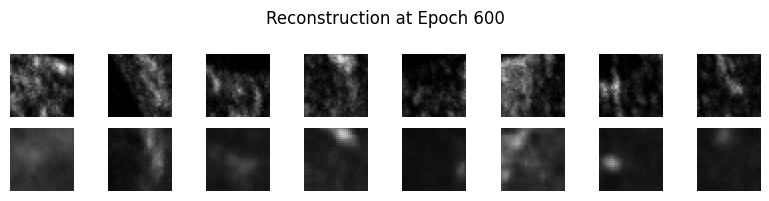

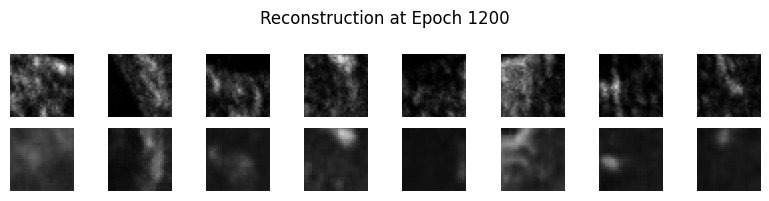

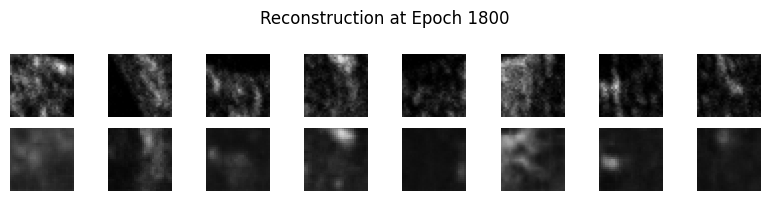

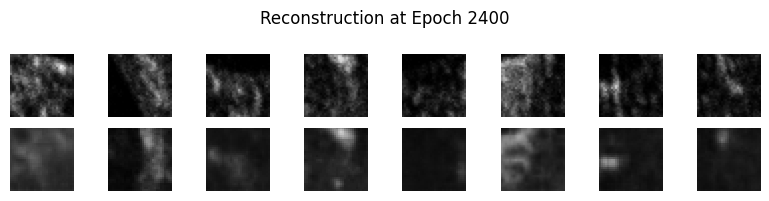

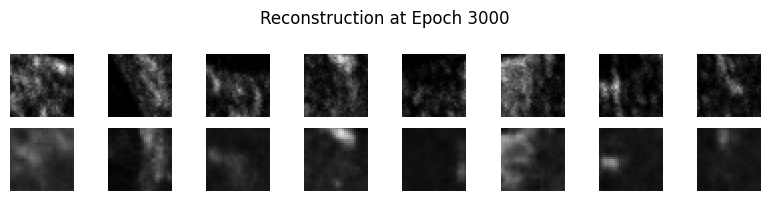

...

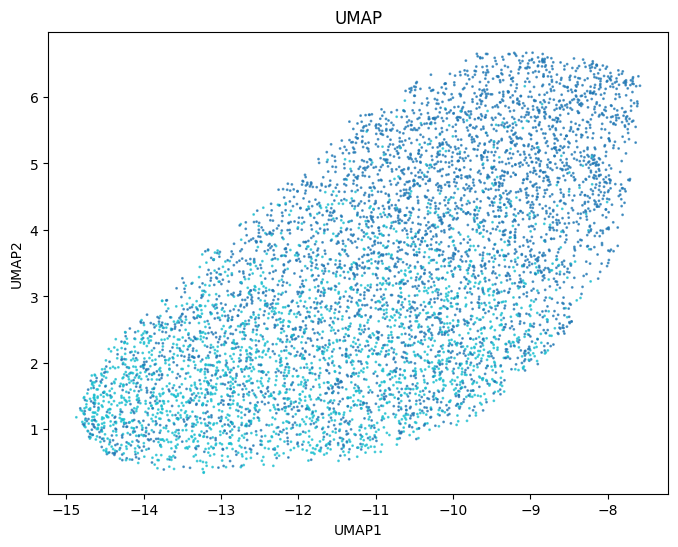

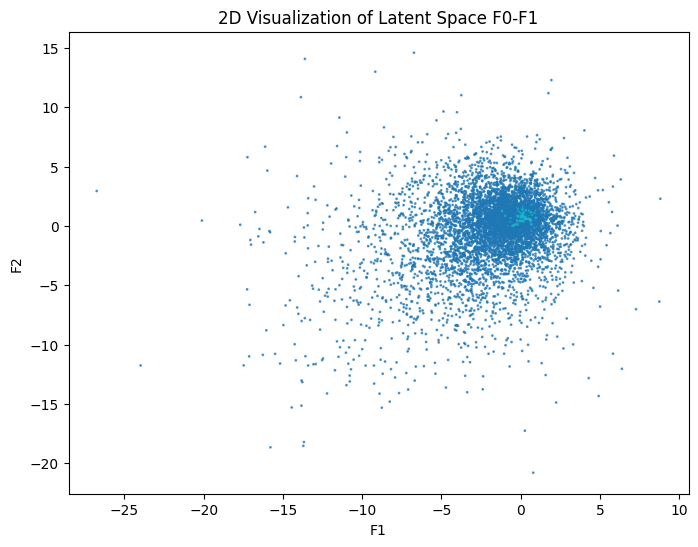

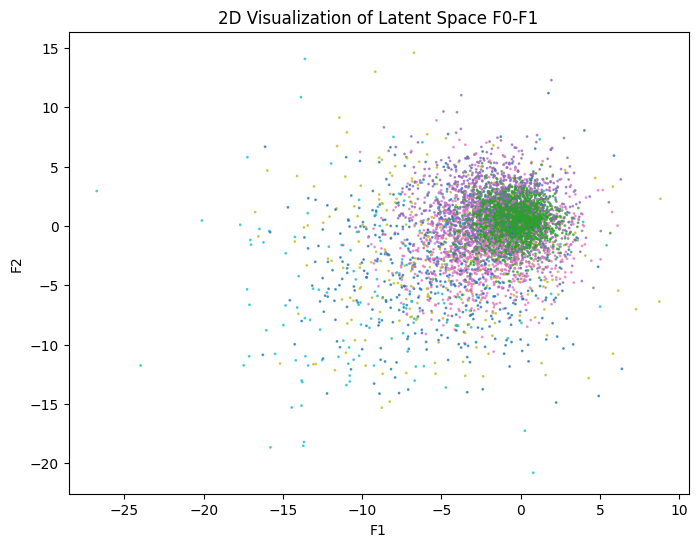

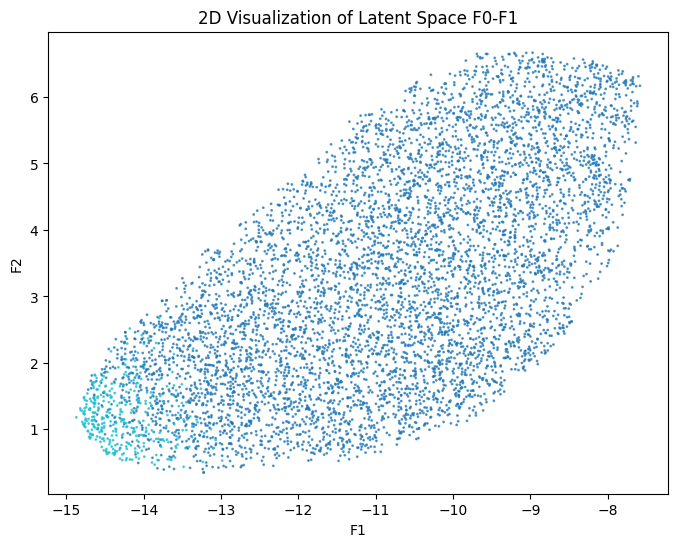

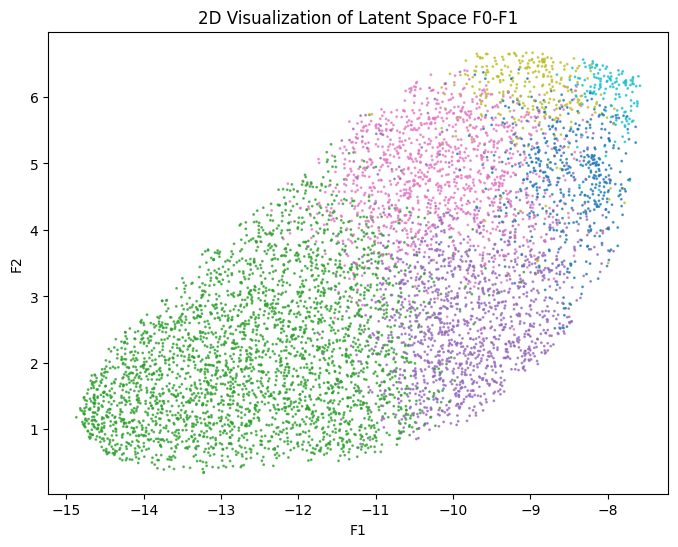

In [10]:
train_loss_across_latentdim = []
val_loss_across_latentdim = []



for  latent_dim in latent_dim_array:
        
    now = datetime.now()

    time_str = now.strftime("%Y%m%d_%H%M")

    result_dir = os.path.join('../results/', pro_str+'_ch' + str(main_ch) +'_'+ 'ps'+str(input_ps)+'_latdim_'+ str(latent_dim) +'_'+ time_str)
    os.makedirs(result_dir, exist_ok=True)

    # Train AE
    ae = AE(latent_dim=latent_dim, input_ps=input_ps, BN_flag=BN_flag, dropout_flag=dropout_flag).to(device)

    ae, train_losses, val_losses = train_ae(ae, train_loader, val_loader, device, epochs=epochs, lr=lr, loss_norm_flag=loss_norm_flag, result_dir = result_dir)

    train_loss_across_latentdim.append(train_losses[-1])
    val_loss_across_latentdim.append(val_losses[-1])
    
    latents, images, group_id = dataloader_model_latents(ae, whole_data_loader, device)

    if isinstance(group_id, torch.Tensor):
        group_id = group_id.cpu().numpy()
    elif isinstance(group_id, list):
        group_id = torch.cat(group_id).cpu().numpy()

    latents_2d = UMAP_train(latents, result_dir)

    DBSCAN, DBSCAN_labels =  DBSCAN_cluster(latents, eps=eps, min_samples=min_samples, result_dir=result_dir)

    kmeans, kmeans_labels = kmeans_cluster(latents, num_clusters=kmeans_num_clusters, result_dir=result_dir)

    fig = umap_2Dplot(latents_2d, 0,1,group_id)
    fig.savefig(os.path.join(result_dir, 'umap_2d_grouplabels.png'))

    fig = cluster_2Dplot(latents, 0,1,DBSCAN_labels)
    fig.savefig(os.path.join(result_dir, 'DBSCAN_latent01_labels.png'))
    
    fig = cluster_2Dplot(latents, 0,1,kmeans_labels)
    fig.savefig(os.path.join(result_dir, 'kmeans_latent01_labels.png'))

    fig = cluster_2Dplot(latents_2d, 0,1,DBSCAN_labels)
    fig.savefig(os.path.join(result_dir, 'DBSCAN_umap2d_labels.png'))
    
    fig = cluster_2Dplot(latents_2d, 0,1,kmeans_labels)
    fig.savefig(os.path.join(result_dir, 'kmeans_umap2d_labels.png'))


In [15]:
min(val_losses)

0.0020294331770855933

In [17]:
val_losses[-20:-1]

[0.002035667020558881,
 0.0020359730562911583,
 0.002046144614443899,
 0.0020312946491265814,
 0.002034964163053351,
 0.002045027195261075,
 0.0020375733863777267,
 0.0020435770633272254,
 0.0020294331770855933,
 0.0020411807569102026,
 0.002036336375078043,
 0.0020433967337549594,
 0.0020356366719799833,
 0.0020482678396197464,
 0.0020317699236329645,
 0.002036383346421644,
 0.0020406749345756206,
 0.002036583685996727,
 0.0020357672854935606]

In [18]:
joblib.dump(train_loss_across_latentdim, os.path.join('../results', 'train_loss_across_latentdim'+pro_str+'_ch' + str(main_ch) +'_'+ 'ps'+str(input_ps)+'_latdim_'+ str(latent_dim) +'_'+ time_str+'.pkl'))
joblib.dump(val_loss_across_latentdim, os.path.join('../results', 'val_loss_across_latentdim'+pro_str+'_ch' + str(main_ch) +'_'+ 'ps'+str(input_ps)+'_latdim_'+ str(latent_dim) +'_'+ time_str+'.pkl'))
    

['../results/val_loss_across_latentdimpax_ch1_ps32_latdim_20_20251001_1821.pkl']

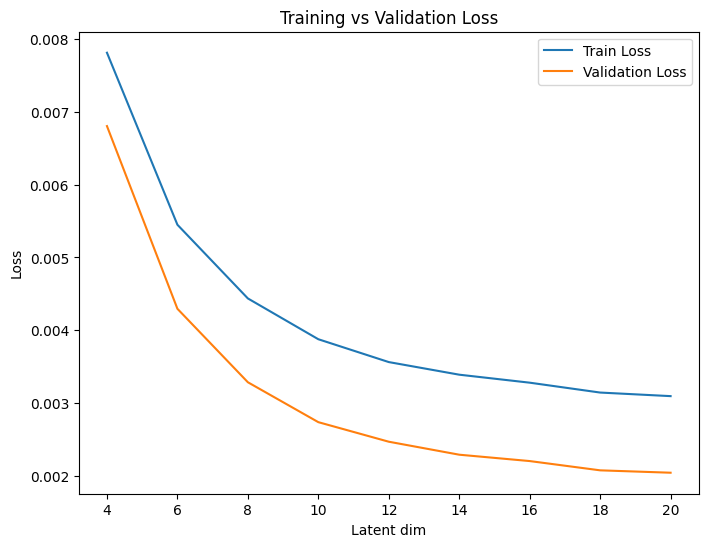

In [11]:
# Plot training and validation loss
fig = plt.figure(figsize=(8, 6))
plt.plot(latent_dim_array, train_loss_across_latentdim, label='Train Loss')
plt.plot(latent_dim_array, val_loss_across_latentdim, label='Validation Loss')
plt.xlabel('Latent dim')
plt.ylabel('Loss')
plt.legend()
plt.title('Training vs Validation Loss')
fig.savefig(os.path.join('../results', 'latent_dim_train_val_losses'+pro_str+'_ch' + str(main_ch) +'_'+ 'ps'+str(input_ps)+'_latdim_'+ str(latent_dim) +'_'+ time_str+'.png'))